# pix2pix for Maps to Aerial Image Translation

In [1]:
import tensorflow as tf
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import load_model
import pixutils as pxu
from pix2pix import UNet, PatchGAN, fit
import wandb
import os

In [2]:
wandb.login()

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [3]:
train_path = "pix2pix-maps/train/*.jpg"
val_path = "pix2pix-maps/val/*.jpg"

buffer_size = 256
patch_size = 256
num_of_patches = (600//patch_size)**2

config = {
    "batch_size": 10,
    "lr_gen": 0.0002,
    "beta_1_gen": 0.5,
    "lr_disc": 0.0002,
    "beta_1_disc": 0.5,
    "l1_lambda": 100,
}

## Run the following code block on Kaggle only

In [4]:
train_path = f"/kaggle/input/{train_path}"
val_path = f"/kaggle/input/{val_path}"

## Load dataset

In [5]:
train = tf.data.Dataset.list_files(train_path)
val = tf.data.Dataset.list_files(val_path)

In [6]:
train = train.map(pxu.load_image)
train = train.map(lambda input_image, real_image: pxu.extract_patches(input_image, real_image, patch_size, num_of_patches))
# data are in batches of size 'num_of_patches' after 'extract_patches'
train = train.unbatch()
train = train.map(lambda input_patches, real_patches: pxu.random_jitter(input_patches, real_patches, 286))
train = train.map(pxu.rescale_images)
train = train.shuffle(buffer_size)
train = train.batch(config["batch_size"])

val = val.map(pxu.load_image)
val = val.map(lambda input_image, real_image: pxu.extract_patches(input_image, real_image, patch_size, num_of_patches))
# data are in batches of size 'num_of_patches' after 'extract_patches'
val = val.unbatch()
val = val.map(pxu.rescale_images)
val = val.batch(config["batch_size"])

## Visualize a few images

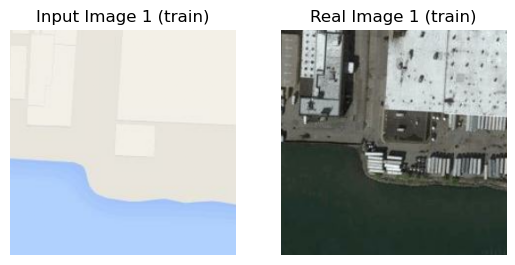

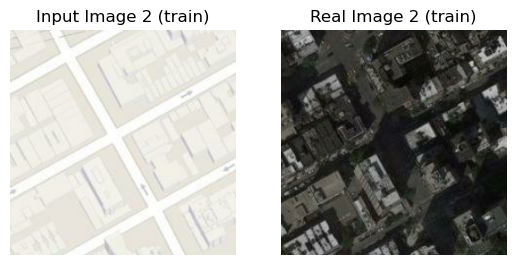

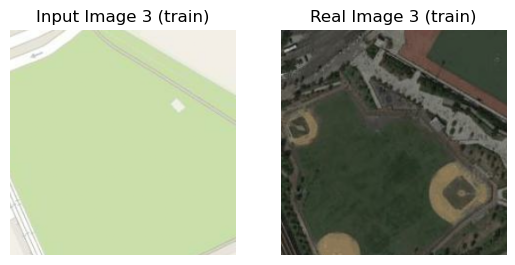

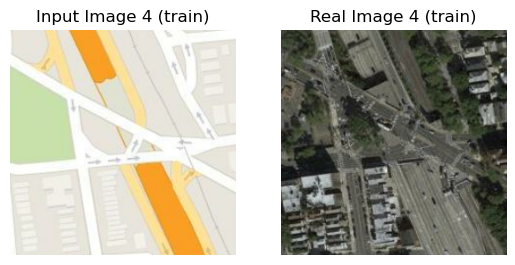

In [7]:
i = 0
for input_batch, real_batch in train.take(1):
    for input_image, real_image in zip(input_batch, real_batch):
        i += 1
        pxu.show(
            input_image,
            real_image,
            i,
            "train"
        )
        if i == 4:
            break

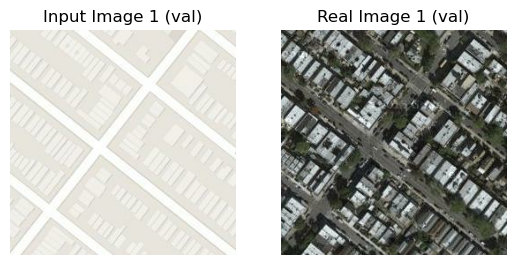

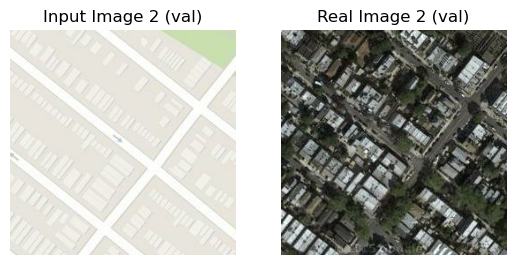

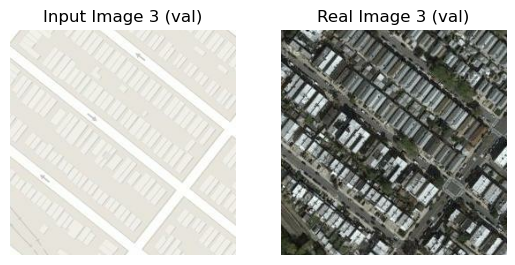

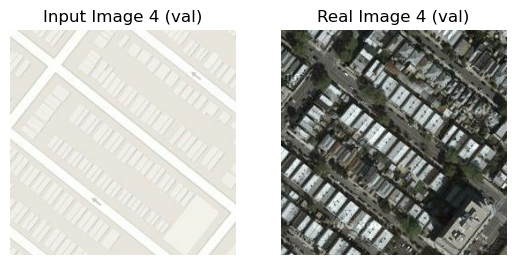

In [8]:
i = 0
for input_batch, real_batch in val.take(1):
    for input_image, real_image in zip(input_batch, real_batch):
        i += 1
        pxu.show(
            input_image,
            real_image,
            i,
            "val"
        )
        if i == 4:
            break

## Create models

In [9]:
G = UNet(input_shape=(patch_size, patch_size, 3))
D = PatchGAN(input_shape=(patch_size, patch_size, 3))

config["epochs"] = 150

restore_last_epoch = None
restore_run_id = None

if restore_last_epoch is not None:
    config["epochs"] -= restore_last_epoch
    run_path = f"nsiete23/pix2pix/{restore_run_id}"
    gen_file = wandb.restore(f"checkpoints/generator_{restore_last_epoch}.h5", run_path=run_path)
    disc_file = wandb.restore(f"checkpoints/discriminator_{restore_last_epoch}.h5", run_path=run_path)
    G = load_model(gen_file.name)
    D = load_model(disc_file.name)
    print(
        "Resumed:",
        gen_file.name,
        disc_file.name,
        sep=os.linesep
    )

g_optim = Adam(learning_rate=config["lr_gen"], beta_1=config["beta_1_gen"])
d_optim = Adam(learning_rate=config["lr_disc"], beta_1=config["beta_1_disc"])

## Train

wandb: Currently logged in as: v-modroczky (nsiete23). Use `wandb login --relogin` to force relogin


2023-04-29 21:49:54.209865: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/sequential_8/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


2023-04-29 21:51:24.341077: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/sequential_8/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Epoch: 1, Step: 439, Gen Loss: 25.6200, Disc Loss: 2.3536


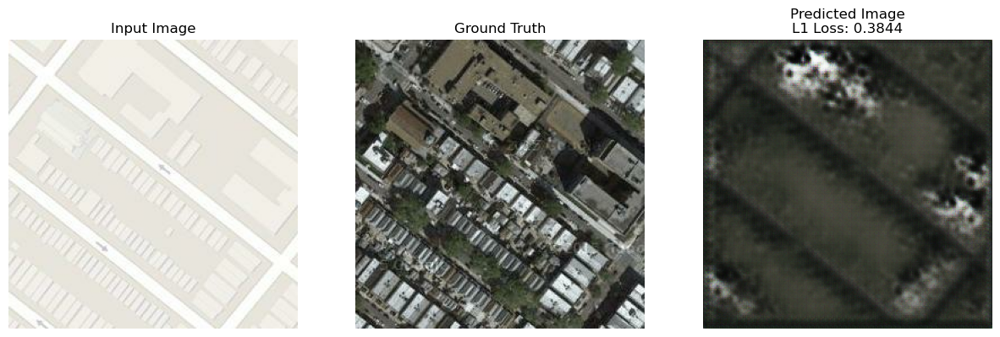

Epoch: 2, Step: 439, Gen Loss: 30.4489, Disc Loss: 0.1549
Epoch: 3, Step: 439, Gen Loss: 29.1084, Disc Loss: 1.1883
Epoch: 4, Step: 439, Gen Loss: 28.4257, Disc Loss: 1.4616
Epoch: 5, Step: 439, Gen Loss: 30.1448, Disc Loss: 0.1681
Epoch: 6, Step: 439, Gen Loss: 29.4362, Disc Loss: 4.2205
Epoch: 7, Step: 439, Gen Loss: 25.6851, Disc Loss: 0.5661
Epoch: 8, Step: 439, Gen Loss: 28.2324, Disc Loss: 1.0968
Epoch: 9, Step: 439, Gen Loss: 22.5447, Disc Loss: 1.0335
Epoch: 10, Step: 439, Gen Loss: 30.4808, Disc Loss: 3.1444


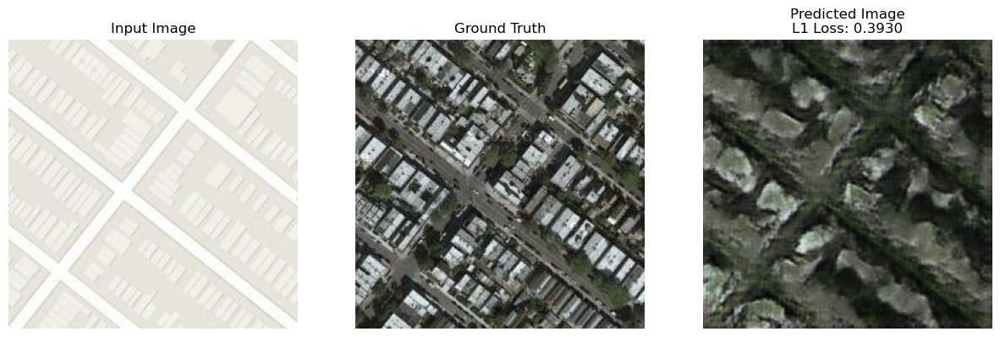

Epoch: 11, Step: 439, Gen Loss: 17.8597, Disc Loss: 3.7667
Epoch: 12, Step: 439, Gen Loss: 24.4816, Disc Loss: 1.0016
Epoch: 13, Step: 439, Gen Loss: 30.6682, Disc Loss: 1.8161
Epoch: 14, Step: 439, Gen Loss: 22.9663, Disc Loss: 0.6296
Epoch: 15, Step: 439, Gen Loss: 29.2442, Disc Loss: 0.3433
Epoch: 16, Step: 439, Gen Loss: 25.7770, Disc Loss: 0.5061
Epoch: 17, Step: 439, Gen Loss: 34.9089, Disc Loss: 0.1575
Epoch: 18, Step: 439, Gen Loss: 27.8581, Disc Loss: 0.3750
Epoch: 19, Step: 439, Gen Loss: 24.9479, Disc Loss: 0.7201
Epoch: 20, Step: 439, Gen Loss: 30.4335, Disc Loss: 0.8049


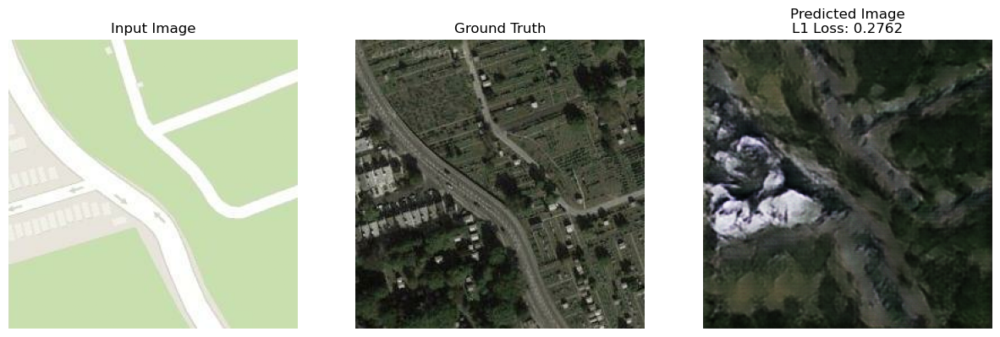

Epoch: 21, Step: 439, Gen Loss: 25.0355, Disc Loss: 0.5790
Epoch: 22, Step: 439, Gen Loss: 28.6414, Disc Loss: 0.6094
Epoch: 23, Step: 439, Gen Loss: 22.8116, Disc Loss: 1.1563
Epoch: 24, Step: 439, Gen Loss: 29.0436, Disc Loss: 0.2911
Epoch: 25, Step: 439, Gen Loss: 18.2877, Disc Loss: 2.4648
Epoch: 26, Step: 439, Gen Loss: 24.1265, Disc Loss: 2.8404
Epoch: 27, Step: 439, Gen Loss: 19.1592, Disc Loss: 0.9782
Epoch: 28, Step: 439, Gen Loss: 25.6290, Disc Loss: 1.1535
Epoch: 29, Step: 439, Gen Loss: 25.0739, Disc Loss: 0.5568
Epoch: 30, Step: 439, Gen Loss: 26.9519, Disc Loss: 0.4703


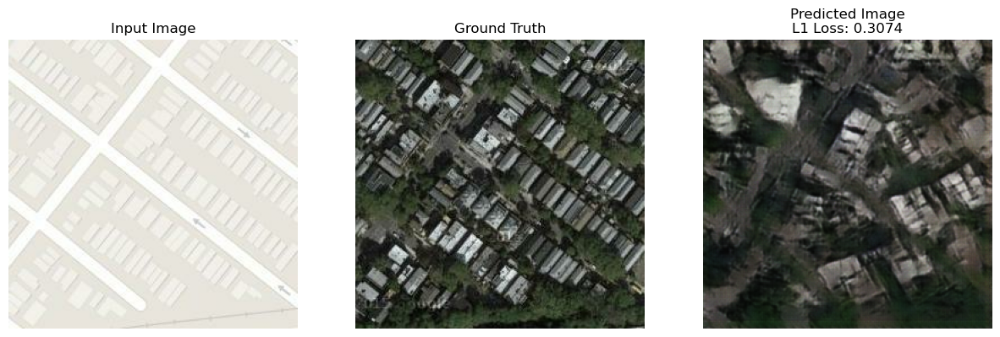

Epoch: 31, Step: 439, Gen Loss: 30.6523, Disc Loss: 0.2390
Epoch: 32, Step: 439, Gen Loss: 22.4236, Disc Loss: 2.2501
Epoch: 33, Step: 439, Gen Loss: 24.1073, Disc Loss: 0.4720
Epoch: 34, Step: 439, Gen Loss: 22.8132, Disc Loss: 1.8960
Epoch: 35, Step: 439, Gen Loss: 27.4388, Disc Loss: 2.9116
Epoch: 36, Step: 439, Gen Loss: 29.4523, Disc Loss: 1.4274
Epoch: 37, Step: 439, Gen Loss: 30.7855, Disc Loss: 0.8901
Epoch: 38, Step: 439, Gen Loss: 28.4993, Disc Loss: 0.4966
Epoch: 39, Step: 439, Gen Loss: 29.6000, Disc Loss: 0.5504
Epoch: 40, Step: 439, Gen Loss: 24.8654, Disc Loss: 0.5699


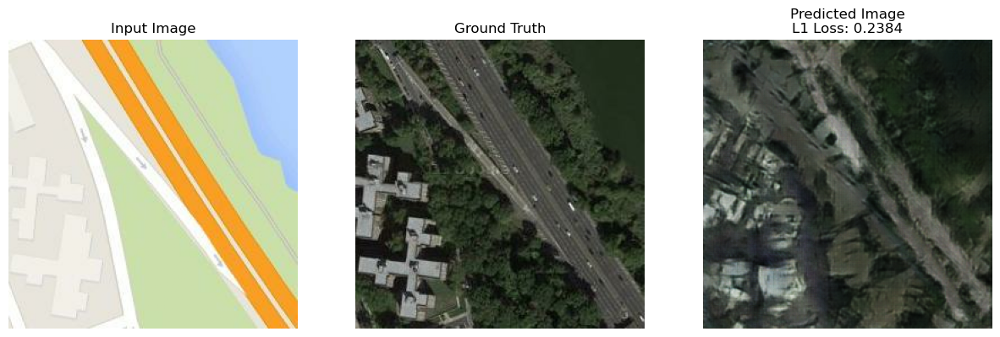

Epoch: 41, Step: 439, Gen Loss: 23.5072, Disc Loss: 2.4747
Epoch: 42, Step: 439, Gen Loss: 32.9106, Disc Loss: 0.3100
Epoch: 43, Step: 439, Gen Loss: 23.0009, Disc Loss: 1.7355
Epoch: 44, Step: 439, Gen Loss: 26.7285, Disc Loss: 2.6016
Epoch: 45, Step: 439, Gen Loss: 30.0738, Disc Loss: 0.5830
Epoch: 46, Step: 439, Gen Loss: 25.2759, Disc Loss: 1.2820
Epoch: 47, Step: 439, Gen Loss: 28.0280, Disc Loss: 0.3195
Epoch: 48, Step: 439, Gen Loss: 27.2181, Disc Loss: 0.2411
Epoch: 49, Step: 439, Gen Loss: 30.5641, Disc Loss: 0.2822
Epoch: 50, Step: 439, Gen Loss: 31.9970, Disc Loss: 0.6779


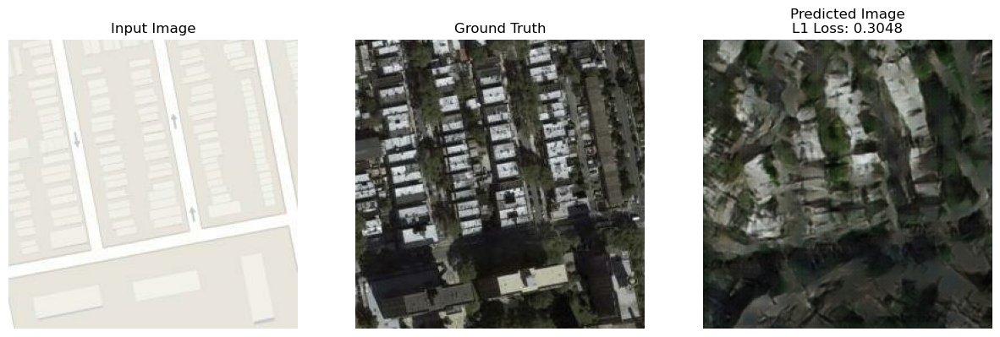

Epoch: 51, Step: 439, Gen Loss: 28.1156, Disc Loss: 0.6663
Epoch: 52, Step: 439, Gen Loss: 20.9835, Disc Loss: 1.3512
Epoch: 53, Step: 439, Gen Loss: 24.7687, Disc Loss: 0.6579
Epoch: 55, Step: 439, Gen Loss: 30.4782, Disc Loss: 0.3326
Epoch: 56, Step: 439, Gen Loss: 27.7044, Disc Loss: 0.2509
Epoch: 57, Step: 439, Gen Loss: 24.0642, Disc Loss: 1.3468
Epoch: 58, Step: 439, Gen Loss: 23.1951, Disc Loss: 1.3459
Epoch: 59, Step: 439, Gen Loss: 21.0238, Disc Loss: 0.8119
Epoch: 60, Step: 439, Gen Loss: 30.6634, Disc Loss: 0.5192


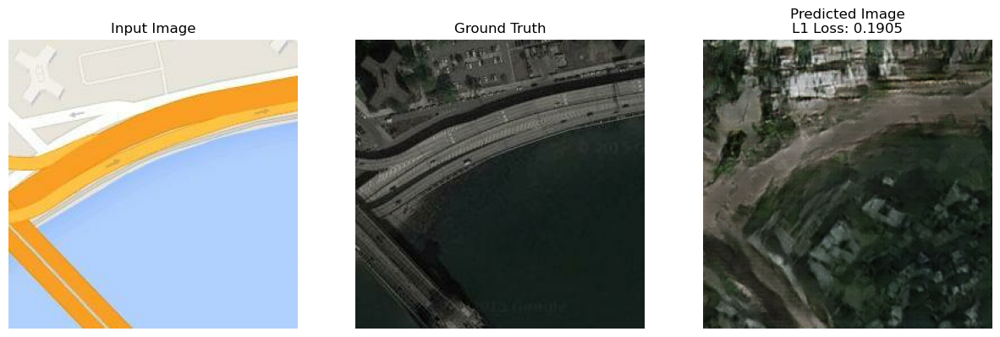

Epoch: 61, Step: 439, Gen Loss: 30.9309, Disc Loss: 0.3262
Epoch: 62, Step: 439, Gen Loss: 29.5741, Disc Loss: 0.7482
Epoch: 63, Step: 439, Gen Loss: 23.3580, Disc Loss: 0.4161
Epoch: 64, Step: 439, Gen Loss: 29.8641, Disc Loss: 0.8999
Epoch: 65, Step: 439, Gen Loss: 25.3456, Disc Loss: 1.0186
Epoch: 66, Step: 439, Gen Loss: 32.6070, Disc Loss: 0.2775
Epoch: 67, Step: 439, Gen Loss: 25.3329, Disc Loss: 0.9319
Epoch: 68, Step: 439, Gen Loss: 28.7097, Disc Loss: 0.5603
Epoch: 69, Step: 439, Gen Loss: 29.4594, Disc Loss: 0.9007
Epoch: 70, Step: 439, Gen Loss: 22.6441, Disc Loss: 1.6300


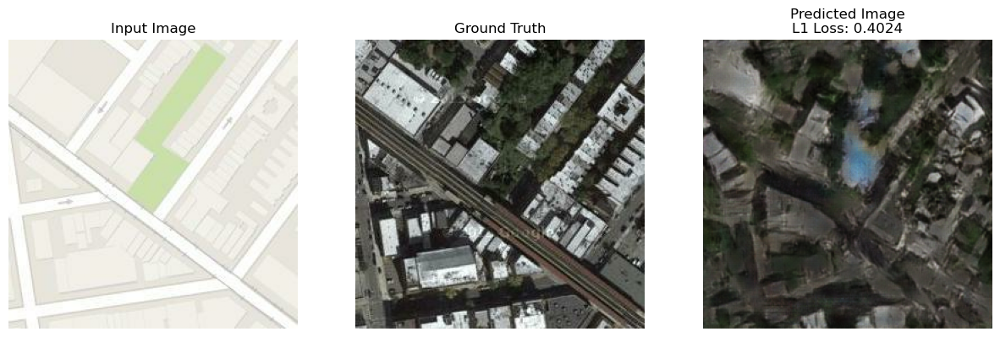

Epoch: 71, Step: 439, Gen Loss: 23.5361, Disc Loss: 1.1086
Epoch: 72, Step: 439, Gen Loss: 24.6967, Disc Loss: 0.6981
Epoch: 73, Step: 439, Gen Loss: 22.4993, Disc Loss: 0.4172
Epoch: 74, Step: 439, Gen Loss: 27.1887, Disc Loss: 0.7944
Epoch: 75, Step: 439, Gen Loss: 22.9628, Disc Loss: 1.5697
Epoch: 76, Step: 439, Gen Loss: 28.6439, Disc Loss: 0.8010
Epoch: 77, Step: 439, Gen Loss: 22.7772, Disc Loss: 0.5023
Epoch: 78, Step: 439, Gen Loss: 27.6523, Disc Loss: 0.5418
Epoch: 79, Step: 439, Gen Loss: 28.4987, Disc Loss: 0.6092
Epoch: 80, Step: 439, Gen Loss: 26.7118, Disc Loss: 2.6612


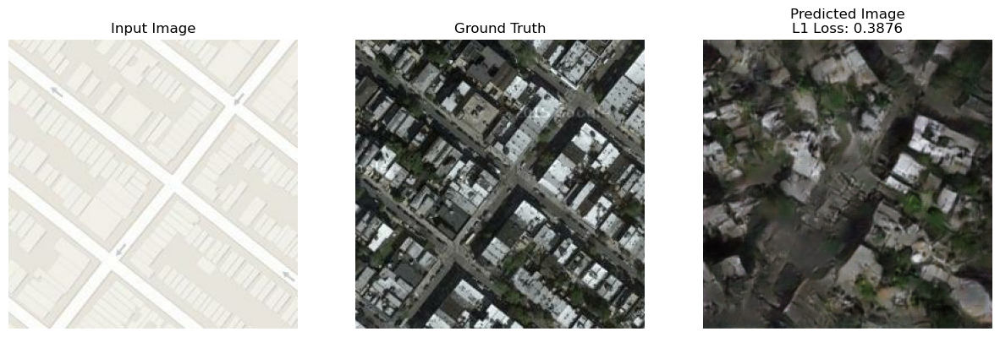

Epoch: 81, Step: 439, Gen Loss: 25.4128, Disc Loss: 2.6125
Epoch: 82, Step: 439, Gen Loss: 26.5961, Disc Loss: 1.4554
Epoch: 83, Step: 439, Gen Loss: 23.4816, Disc Loss: 0.4919
Epoch: 84, Step: 439, Gen Loss: 30.3831, Disc Loss: 0.2001
Epoch: 85, Step: 439, Gen Loss: 24.5308, Disc Loss: 1.2714
Epoch: 86, Step: 439, Gen Loss: 23.7273, Disc Loss: 0.4368
Epoch: 87, Step: 439, Gen Loss: 23.3161, Disc Loss: 0.7180
Epoch: 88, Step: 439, Gen Loss: 28.4568, Disc Loss: 1.3918
Epoch: 89, Step: 439, Gen Loss: 25.8501, Disc Loss: 2.1987
Epoch: 90, Step: 439, Gen Loss: 25.6396, Disc Loss: 0.3326


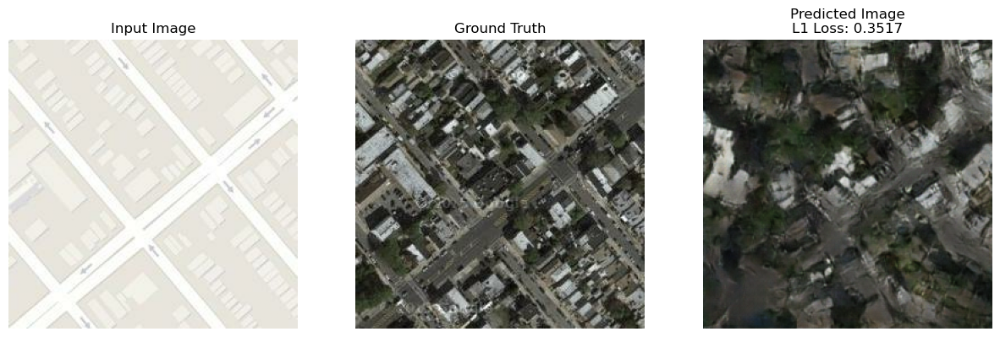

Epoch: 91, Step: 439, Gen Loss: 26.2151, Disc Loss: 1.0608
Epoch: 92, Step: 439, Gen Loss: 26.9473, Disc Loss: 1.2578
Epoch: 93, Step: 439, Gen Loss: 21.1807, Disc Loss: 1.3332
Epoch: 94, Step: 439, Gen Loss: 27.9034, Disc Loss: 0.6157
Epoch: 95, Step: 439, Gen Loss: 24.8621, Disc Loss: 0.8045
Epoch: 96, Step: 439, Gen Loss: 26.5159, Disc Loss: 0.7387
Epoch: 97, Step: 439, Gen Loss: 27.6811, Disc Loss: 0.5381
Epoch: 98, Step: 439, Gen Loss: 25.0423, Disc Loss: 1.3469
Epoch: 99, Step: 439, Gen Loss: 27.3808, Disc Loss: 0.9906
Epoch: 100, Step: 439, Gen Loss: 23.9641, Disc Loss: 0.2401


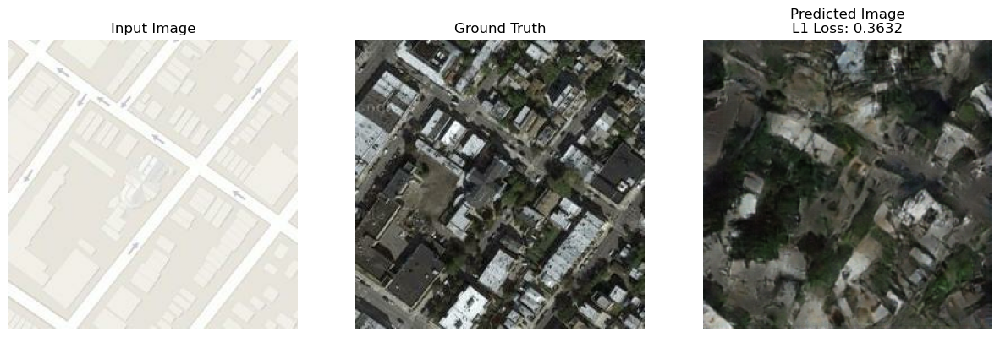

Epoch: 101, Step: 439, Gen Loss: 30.8295, Disc Loss: 0.2852
Epoch: 102, Step: 439, Gen Loss: 23.3411, Disc Loss: 0.3843
Epoch: 103, Step: 439, Gen Loss: 30.9344, Disc Loss: 0.2363
Epoch: 104, Step: 439, Gen Loss: 29.4559, Disc Loss: 0.8271
Epoch: 105, Step: 439, Gen Loss: 27.7899, Disc Loss: 0.4936
Epoch: 106, Step: 439, Gen Loss: 32.2408, Disc Loss: 0.4077
Epoch: 107, Step: 439, Gen Loss: 24.6609, Disc Loss: 2.6021
Epoch: 108, Step: 439, Gen Loss: 34.6984, Disc Loss: 0.1923
Epoch: 109, Step: 439, Gen Loss: 37.0229, Disc Loss: 0.0994
Epoch: 110, Step: 439, Gen Loss: 16.2736, Disc Loss: 1.0401


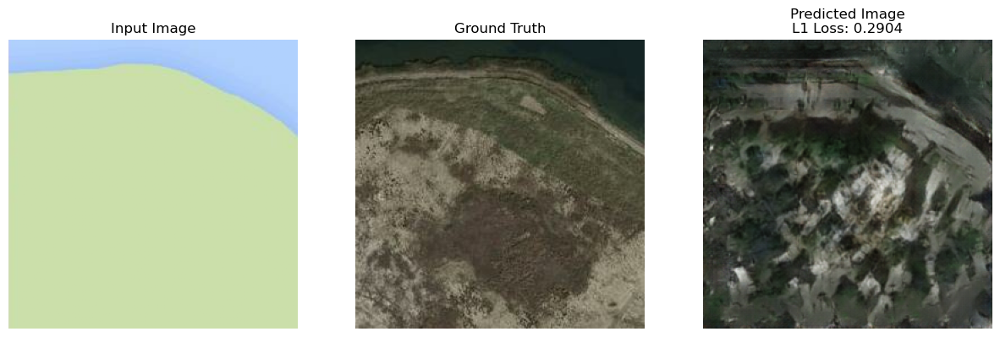

Epoch: 111, Step: 439, Gen Loss: 28.6345, Disc Loss: 0.2677
Epoch: 112, Step: 439, Gen Loss: 22.5882, Disc Loss: 0.9986
Epoch: 113, Step: 439, Gen Loss: 27.5969, Disc Loss: 1.0247
Epoch: 114, Step: 439, Gen Loss: 22.3051, Disc Loss: 0.2383
Epoch: 115, Step: 439, Gen Loss: 30.7767, Disc Loss: 0.3824
Epoch: 116, Step: 439, Gen Loss: 26.8481, Disc Loss: 1.0899
Epoch: 117, Step: 439, Gen Loss: 29.1203, Disc Loss: 3.2608
Epoch: 118, Step: 439, Gen Loss: 30.2622, Disc Loss: 0.1010
Epoch: 119, Step: 439, Gen Loss: 28.5485, Disc Loss: 0.3977
Epoch: 120, Step: 439, Gen Loss: 35.0903, Disc Loss: 0.3268


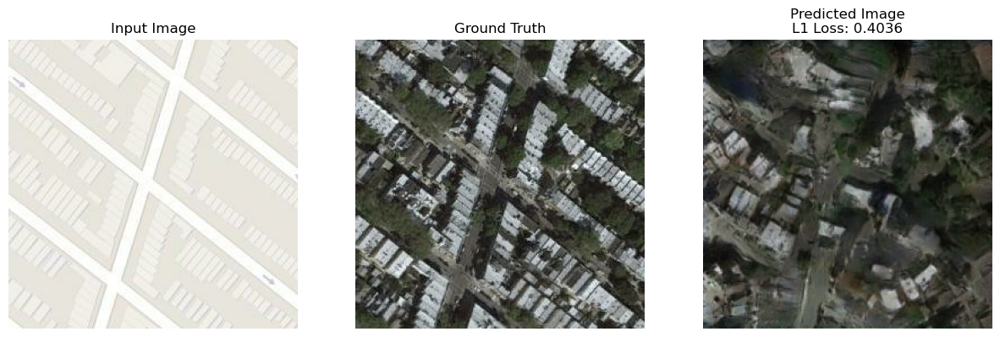

Epoch: 121, Step: 439, Gen Loss: 32.3879, Disc Loss: 0.4734
Epoch: 122, Step: 439, Gen Loss: 30.6857, Disc Loss: 0.7361
Epoch: 123, Step: 439, Gen Loss: 28.4633, Disc Loss: 0.1413
Epoch: 124, Step: 439, Gen Loss: 21.8285, Disc Loss: 1.1349
Epoch: 125, Step: 439, Gen Loss: 30.6170, Disc Loss: 0.9523
Epoch: 126, Step: 439, Gen Loss: 30.9895, Disc Loss: 0.2411
Epoch: 127, Step: 439, Gen Loss: 23.4029, Disc Loss: 1.4768
Epoch: 128, Step: 439, Gen Loss: 26.7634, Disc Loss: 0.5151
Epoch: 129, Step: 439, Gen Loss: 33.0919, Disc Loss: 0.1592
Epoch: 130, Step: 439, Gen Loss: 28.2736, Disc Loss: 0.4099


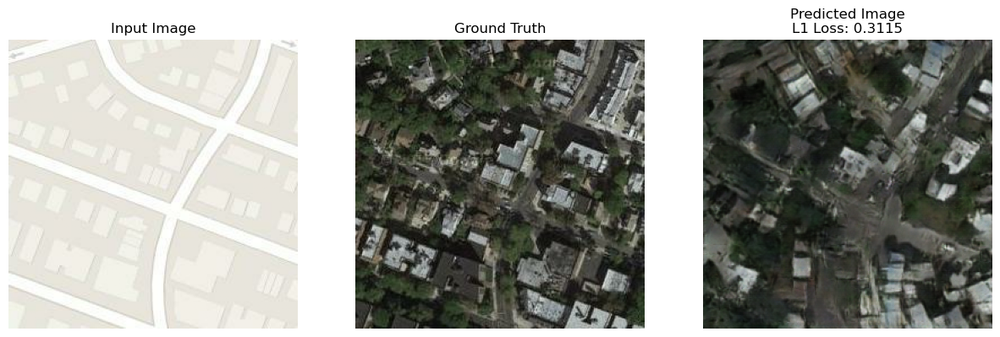

Epoch: 131, Step: 439, Gen Loss: 24.1341, Disc Loss: 0.6010
Epoch: 132, Step: 439, Gen Loss: 24.7320, Disc Loss: 0.8079
Epoch: 133, Step: 439, Gen Loss: 19.0269, Disc Loss: 0.9125
Epoch: 134, Step: 439, Gen Loss: 22.3111, Disc Loss: 2.0279
Epoch: 135, Step: 439, Gen Loss: 29.1802, Disc Loss: 0.2024
Epoch: 136, Step: 439, Gen Loss: 26.2852, Disc Loss: 0.5794
Epoch: 137, Step: 439, Gen Loss: 34.9626, Disc Loss: 0.0642
Epoch: 138, Step: 439, Gen Loss: 27.0777, Disc Loss: 1.9245
Epoch: 139, Step: 439, Gen Loss: 19.0533, Disc Loss: 0.4970
Epoch: 140, Step: 439, Gen Loss: 30.0129, Disc Loss: 1.2244


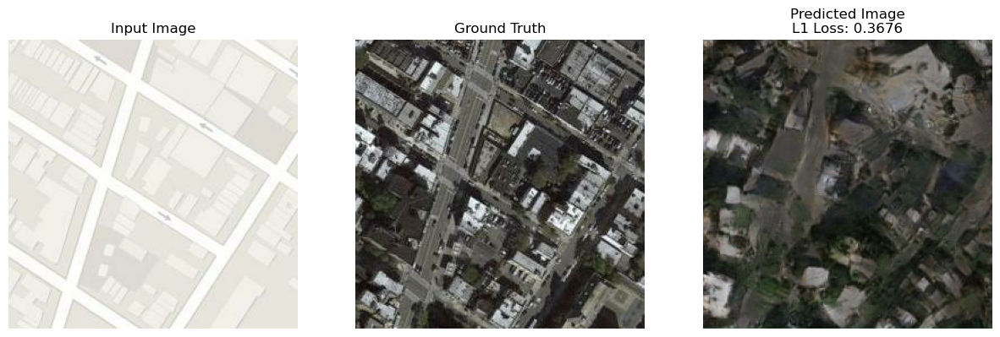

Epoch: 141, Step: 439, Gen Loss: 29.0572, Disc Loss: 0.2640
Epoch: 142, Step: 439, Gen Loss: 25.3429, Disc Loss: 0.3039
Epoch: 143, Step: 439, Gen Loss: 22.4069, Disc Loss: 1.4675
Epoch: 144, Step: 439, Gen Loss: 31.3251, Disc Loss: 0.3835
Epoch: 145, Step: 439, Gen Loss: 22.0503, Disc Loss: 0.4636
Epoch: 146, Step: 439, Gen Loss: 21.3598, Disc Loss: 0.7129
Epoch: 147, Step: 439, Gen Loss: 25.6988, Disc Loss: 0.4285
Epoch: 148, Step: 439, Gen Loss: 19.2930, Disc Loss: 1.1193
Epoch: 149, Step: 439, Gen Loss: 25.7082, Disc Loss: 0.7792
Epoch: 150, Step: 439, Gen Loss: 23.6384, Disc Loss: 0.3686


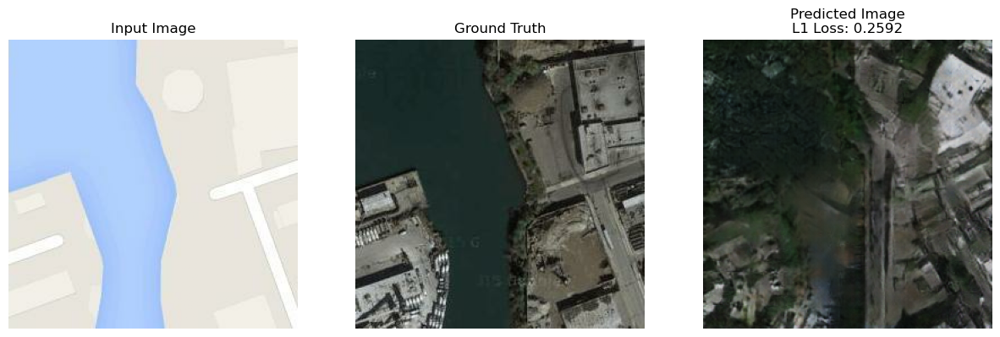

In [10]:
run = wandb.init(config=config, project="pix2pix")

fit(
    train_data=train,
    val_data=val,
    epochs=config["epochs"],
    generator=G,
    discriminator=D,
    generator_optimizer=g_optim,
    discriminator_optimizer=d_optim,
    l1_lambda=config["l1_lambda"],
)

In [11]:
wandb.finish()

epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
fake_d_loss,▂▅▇▇▇█▆▆█▇██▇▆▆▅▅▅▅▅▅▄▃▃▃▃▄▂▃▂▂▂▁▂▁▁▂▁▂▂
fake_d_real_class_loss,▅▃▂▂▂▁▂▂▁▁▁▁▁▃▂▃▃▃▄▄▄▄▅▅▆▆▅▆▆▇▆▇█▇▇████▇
l1_loss,▆▇████▇▇▇▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁
real_d_loss,▂▅▆▆▇█▆▇▇▇█▇▇▆▆▅▅▄▅▄▄▄▃▃▃▃▃▃▂▂▂▂▁▂▂▂▂▁▁▂
total_disc_loss,▂▅▇▇▇█▆▇▇▇███▆▆▅▅▅▅▄▅▄▃▃▃▃▃▂▂▂▂▂▁▂▁▂▂▁▁▂
total_gen_loss,▆██▇▇▇▇▆▆▅▅▅▄▅▄▄▄▅▄▃▄▃▄▄▃▃▃▃▂▂▃▃▂▂▂▂▂▂▂▁
epoch,150
fake_d_loss,0.32407
fake_d_real_class_loss,2.22809
l1_loss,0.23046
